This experiment studies the forward diffusion process and compares ancestral DDPM sampling with deterministic DDIM sampling. The main focus is the trade-off between the number of denoising steps, inference time, and visual quality.

In [1]:
# Repository accompanying the classifier-guidance paper. I use its pretrained ImageNet diffusion model.
!git clone https://github.com/openai/guided-diffusion.git

# Class-conditional diffusion checkpoint trained on ImageNet at 128x128 resolution.
!wget https://openaipublic.blob.core.windows.net/diffusion/jul-2021/128x128_diffusion.pt

Cloning into 'guided-diffusion'...
remote: Enumerating objects: 113, done.
remote: Total 113 (delta 0), reused 0 (delta 0), pack-reused 113 (from 1)
Receiving objects: 100% (113/113), 67.83 KiB | 1.94 MiB/s, done.
Resolving deltas: 100% (47/47), done.
--2026-08-06 19:21:49--  https://openaipublic.blob.core.windows.net/diffusion/jul-2021/128x128_diffusion.pt
Resolving openaipublic.blob.core.windows.net (openaipublic.blob.core.windows.net)... 57.150.97.129
Connecting to openaipublic.blob.core.windows.net (openaipublic.blob.core.windows.net)|57.150.97.129|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1686227960 (1.6G) [application/octet-stream]
Saving to: ‘128x128_diffusion.pt’

128x128_diffusion.p 100%[===================>]   1.57G   572KB/s    in 31m 55s 

2026-08-06 19:53:46 (860 KB/s) - ‘128x128_diffusion.pt’ saved [1686227960/1686227960]



In [1]:
import os
import sys
import torch
import requests
import numpy as np
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt

sys.path.append('guided-diffusion')

from PIL import Image
from tqdm import tqdm
from io import BytesIO
from guided_diffusion.unet import UNetModel

sys.path.append(os.path.abspath('..'))

from utils.utils import return_device

In [2]:
device = return_device()

Device is cuda


## DDPM

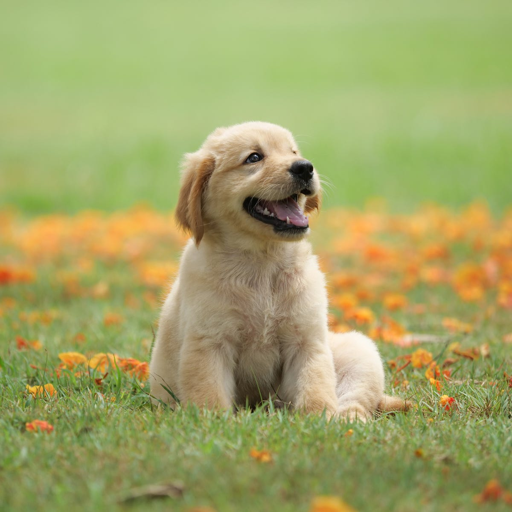

In [3]:
img_url = 'https://hips.hearstapps.com/hmg-prod/images/dog-puppy-on-garden-royalty-free-image-1586966191.jpg?crop=0.752xw:1.00xh;0.175xw,0&resize=1200:*'
image = Image.open(BytesIO(requests.get(img_url).content)).resize((512,512))
image

In [4]:
# Define the total number of diffusion steps and the beta/alpha schedules.
T = 1000
betas = np.linspace(1e-4, 0.02, T)
alphas =  np.cumprod(1 - betas, axis=0)

## Forward diffusion process

The iterative formulation below applies the forward transition one step at a time until timestep $t$.

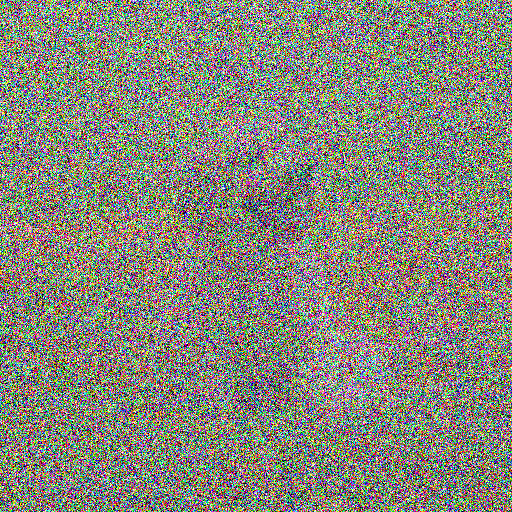

In [5]:
# Convert the image to a NumPy array and normalize it to [-1, 1].
x_0 = np.array(image).astype(np.float32)/127.5 - 1
t = 500

x_t = x_0
for i in range(t+1):
    epsilon = np.random.randn(*x_0.shape)
    x_t = x_t * (1-betas[i])**0.5 + epsilon * betas[i]**0.5

# Visualize the noisy sample.
Image.fromarray((x_t.clip(-1, 1)*127.5+127.5).astype(np.uint8))

Both procedures sample from the same marginal distribution at timestep t, although individual realizations differ because they use independent noise.

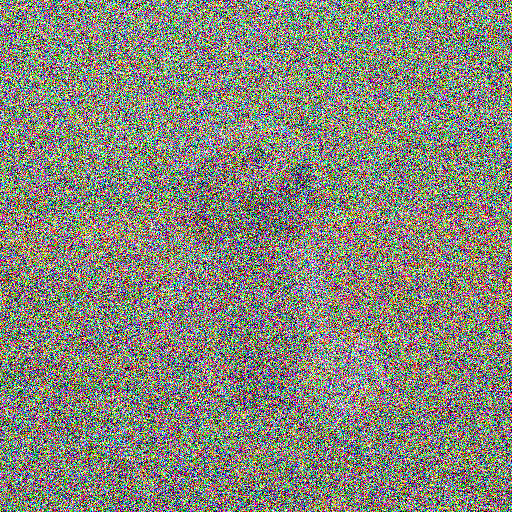

In [6]:
x_0 = np.array(image).astype(np.float32)/127.5 - 1
t = 500

epsilon = np.random.randn(*x_0.shape)
x_t = x_0 * alphas[t]**0.5 + epsilon * (1-alphas[t])**0.5

Image.fromarray((x_t.clip(-1, 1)*127.5+127.5).astype(np.uint8))

The iterative and closed-form procedures produce visually similar samples at the same timestep.

## Backward diffusion process

I load a pretrained class-conditional diffusion model trained on ImageNet at $128\times128$ resolution and use it for image generation.

In [7]:
model128 = UNetModel(
    image_size=128,
    in_channels=3,
    out_channels=6,
    model_channels=256,
    channel_mult=(1,1,2,3,4),
    num_res_blocks=2,
    num_heads=4,
    attention_resolutions=(16, 8, 4),
    num_classes=1000,
    resblock_updown=True,
    use_scale_shift_norm=True
)

model128.to(device)
model128.load_state_dict(torch.load('./128x128_diffusion.pt'))

/tmp/ipykernel_2793/2339558965.py:16: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model128.load_state_dict(torch.load('./128x128_diffusion.pt'))


<All keys matched successfully>

In [8]:
class_number = 50

batch_size = 5
x_t = torch.randn((batch_size, 3, 128, 128), device=device, dtype=torch.float32)
y = torch.Tensor([class_number] * batch_size).to(device).to(torch.int32)

x_0_arr = [[] for i in range(batch_size)]

save_steps = [999, 750, 500, 250, 0]

for t in tqdm(reversed(range(T))):
    t_ = torch.Tensor([t] * batch_size).to(device).to(torch.int32)
    with torch.no_grad():
        eps_prediction = model128(x_t, t_, y)[:, :3, :, :]

    x_0 = (x_t - (1 - alphas[t])**0.5 * eps_prediction) / alphas[t]**0.5

    if t in save_steps:
        for i in range(x_0.shape[0]):
            x_0_arr[i].append(Image.fromarray((x_0[i].permute(1, 2, 0).cpu().clamp(-1, 1) * 127.5 + 127.5).numpy().astype(np.uint8)))

    x_t_minus_1 = ((x_t - betas[t] / (1 - alphas[t])**0.5 * eps_prediction) / (1 - betas[t])**0.5 + betas[t]**0.5 * torch.randn(*x_t.shape, device=device))

    x_t = x_t_minus_1

1000it [02:53,  5.76it/s]


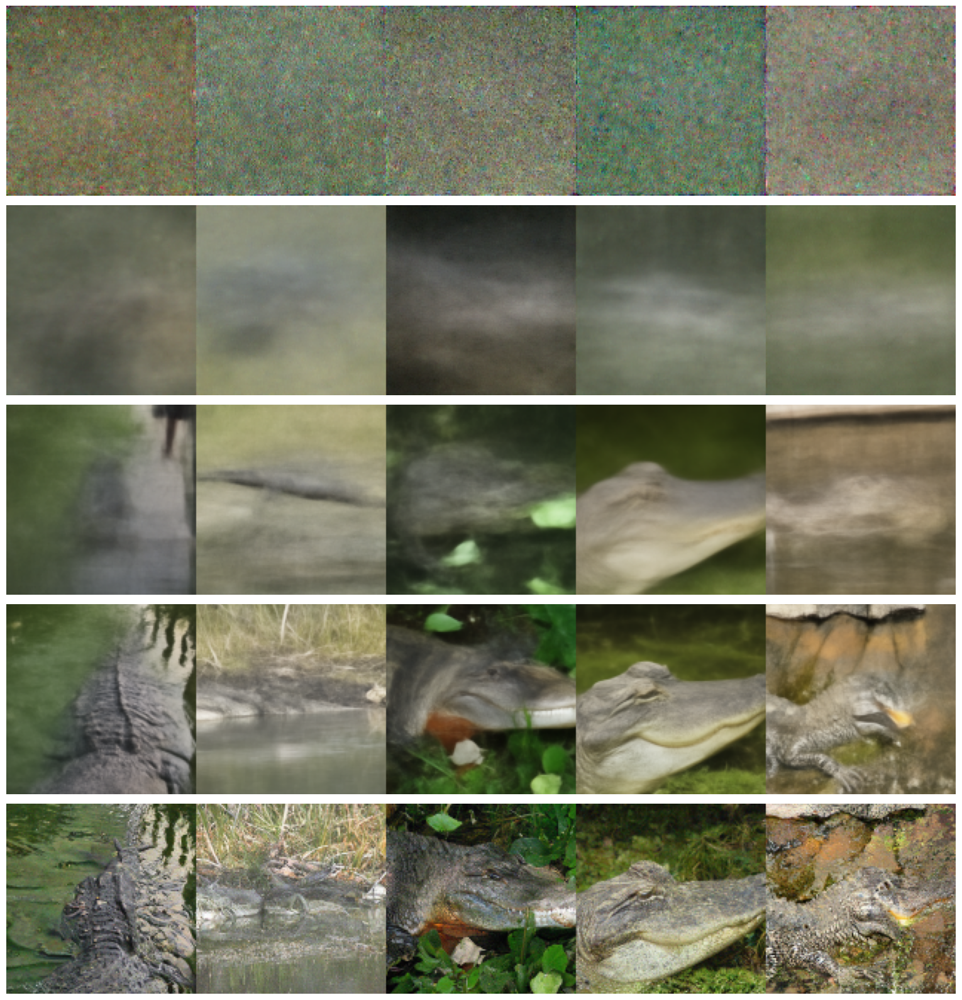

In [9]:
fig, axes = plt.subplots(nrows=len(save_steps), ncols=1, figsize=(16, 16))
for idx, ax in enumerate(axes.flatten()):
    img = np.concatenate([x_0_arr[i][idx] for i in range(batch_size)], axis=1)
    ax.imshow(img)
    ax.axis('off')

plt.tight_layout()
plt.show()

## Speedup

The next experiment reduces inference cost by skipping diffusion steps.

Because each $\beta_t$ describes a transition between two consecutive states, the transition coefficients must be recomputed when the sampler jumps from $t-N$ directly to $t$.

The cumulative $\alpha_t$ values already describe transitions from $x_0$ to $x_t$, so they remain unchanged.

In [10]:
# Recompute beta transitions for a respaced schedule defined by delta.
def respace(alphas, T, delta):
    new_betas = []
    new_T = sorted(list(set(np.linspace(0, T-1, num=T//delta).astype(int))))

    alpha_last = 1.
    for i in range(T):
        if i in new_T:
            new_betas.append(1 - alphas[i]/alpha_last)
            alpha_last = alphas[i]
        else:
            new_betas.append(-1)

    return new_betas, new_T[::-1]

In [11]:
# Set the timestep stride.
delta = 5
new_betas, new_T = respace(alphas, T, delta)

batch_size = 5
x_t = torch.randn((batch_size, 3, 128, 128), device=device, dtype=torch.float32)
y = torch.Tensor([class_number]*batch_size).to(device).to(torch.int32)

x_0_arr = [[] for i in range(batch_size)]

save_steps = set(np.linspace(0, len(new_T) - 1, 9, dtype=int))

for step_idx, t in enumerate(tqdm(new_T)):
    t_ = torch.Tensor([t]).to(device).to(torch.int32)
    with torch.no_grad():
        eps_prediction = model128(x_t, t_, y)[:, :3, :, :]

    x_0 = (x_t - (1-alphas[t])**0.5 * eps_prediction) / alphas[t]**0.5

    if step_idx in save_steps:
        for i in range(x_0.shape[0]):
            x_0_arr[i].append(Image.fromarray((x_0[i].permute(1, 2, 0).cpu().clamp(-1, 1) * 127.5 + 127.5).numpy().astype(np.uint8)))

    x_t_minus_1 = (x_t - new_betas[t] / (1-alphas[t])**0.5 * eps_prediction)/(1-new_betas[t])**0.5 + new_betas[t]**0.5 * torch.randn(*x_t.shape, device=device)

    x_t = x_t_minus_1

100%|██████████| 200/200 [00:34<00:00,  5.77it/s]


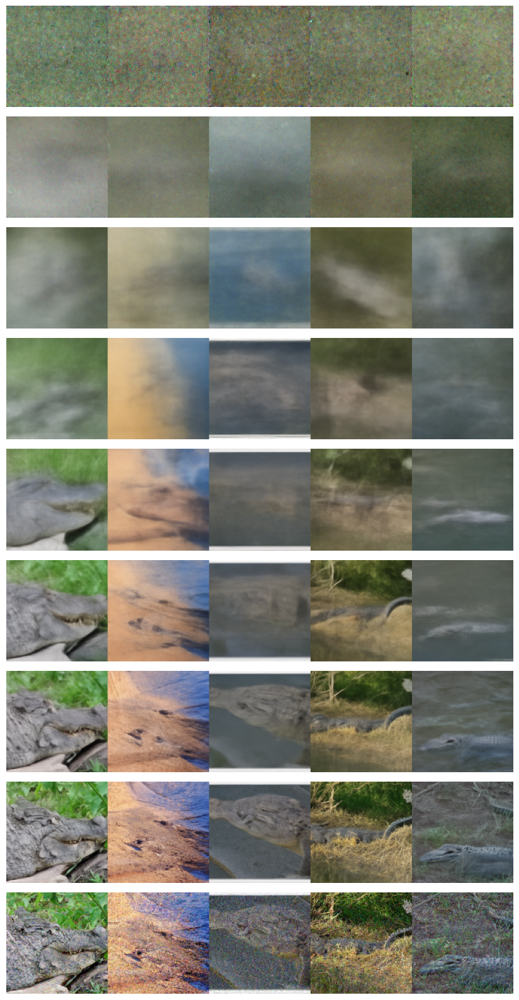

In [12]:
fig, axes = plt.subplots(nrows=len(save_steps), ncols=1, figsize=(16, 16))
for idx, ax in enumerate(axes.flatten()):
    img = np.concatenate([x_0_arr[i][idx] for i in range(batch_size)], axis=1)
    ax.imshow(img)
    ax.axis('off')

plt.tight_layout()
plt.show()

# DDIM

I implement the deterministic sampling update from the DDIM paper by setting $\sigma_t=0$ at every timestep.

At the final update, where no previous cumulative alpha exists, $\bar{\alpha}_{t-1}$ is treated as 1.

In [13]:
# Set the timestep stride.
delta = 5
new_betas, new_T = respace(alphas, T, delta)

batch_size = 5
x_t = torch.randn((batch_size, 3, 128, 128), device=device, dtype=torch.float32)
y = torch.Tensor([class_number]*batch_size).to(device).to(torch.int32)

x_0_arr = [[] for i in range(batch_size)]

pairs = list(zip(new_T, new_T[1:] + [-1]))
save_steps = set(np.linspace(0, len(pairs) - 1, 9, dtype=int))

for step_idx, (t, t_minus_1) in enumerate(tqdm(pairs)):
    t_ = torch.Tensor([t]).to(device).to(torch.int32)
    with torch.no_grad():
        eps_prediction = model128(x_t, t_, y)[:, :3, :, :]
        
        x_0 = (x_t - (1-alphas[t])**0.5 * eps_prediction) / alphas[t]**0.5
        
        if step_idx in save_steps:
            for i in range(x_0.shape[0]):
                x_0_arr[i].append(Image.fromarray((x_0[i].permute(1, 2, 0).cpu().clamp(-1, 1) * 127.5 + 127.5).numpy().astype(np.uint8)))
                
        if t != 0:
            x_t_minus_1 = (x_t - (1-alphas[t])**0.5 * eps_prediction) * alphas[t_minus_1]**0.5 / (alphas[t])**0.5 + (1-alphas[t_minus_1])**0.5 * eps_prediction
        else:
            x_t_minus_1 = (x_t - (1-alphas[t])**0.5 * eps_prediction) * 1**0.5 / (alphas[t])**0.5 + (1-1)**0.5 * eps_prediction
    
        x_t = x_t_minus_1

100%|██████████| 200/200 [00:34<00:00,  5.76it/s]


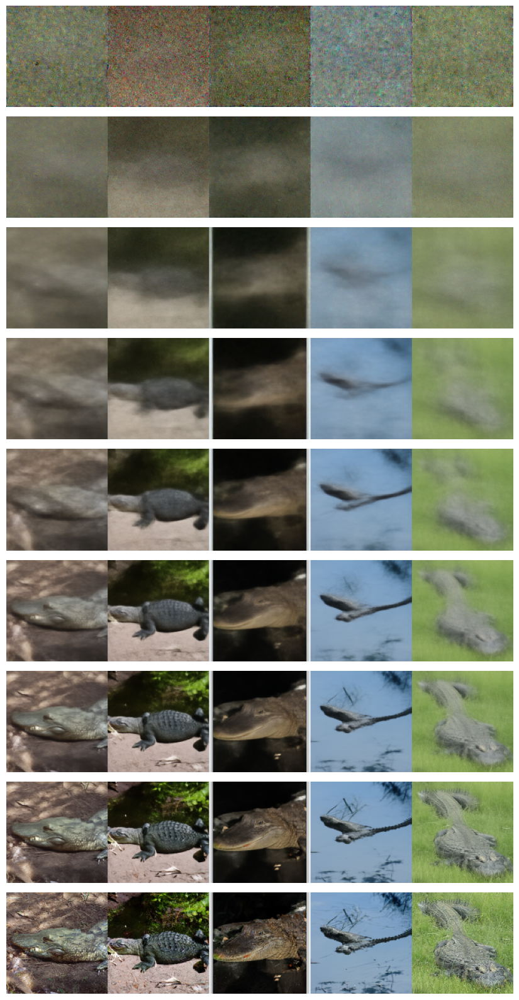

In [14]:
fig, axes = plt.subplots(nrows=len(save_steps), ncols=1, figsize=(16, 16))
for idx, ax in enumerate(axes.flatten()):
    img = np.concatenate([x_0_arr[i][idx] for i in range(batch_size)], axis=1)
    ax.imshow(img)
    ax.axis('off')

plt.tight_layout()
plt.show()

Reducing the number of denoising steps provides an approximately proportional inference speedup. Aggressive DDPM respacing introduces visible degradation because each transition remains stochastic. Deterministic DDIM sampling preserves the global image structure more consistently when fewer steps are used.